In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import matplotlib

In [3]:
import os
import logging
import argparse
import glob
import json
from multiprocessing import Pool

import numpy as np
from matplotlib.ticker import StrMethodFormatter
from scipy import stats, integrate
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from sklearn import metrics
import tensorflow as tf
import pandas as pd
from astropy.table import Table  # for NSA
from astropy import units as u
from sklearn.metrics import confusion_matrix, roc_curve
from PIL import Image
from scipy.stats import binom
from IPython.display import display, Markdown
import statsmodels.api as sm

from shared_astro_utils import astropy_utils, matching_utils
from zoobot.estimators import make_predictions, bayesian_estimator_funcs
from zoobot.tfrecord import read_tfrecord
from zoobot.uncertainty import discrete_coverage
from zoobot.estimators import input_utils, losses
from zoobot.tfrecord import catalog_to_tfrecord
from zoobot.active_learning import metrics, simulated_metrics, acquisition_utils, check_uncertainty, simulation_timeline, run_estimator_config
from zoobot.active_learning import acquisition_utils
from zoobot import label_metadata

In [4]:
os.chdir('/home/walml/repos/zoobot')

In [5]:

questions = label_metadata.gz2_questions
label_cols = label_metadata.gz2_label_cols
version = 'gz2'

# questions = label_metadata.decals_questions
# label_cols = label_metadata.decals_label_cols
# version = 'decals'

schema = losses.Schema(label_cols, questions, version=version)
schema.questions

{smooth-or-featured, indices 0 to 1, asked after None: (0, 1), disk-edge-on, indices 2 to 3, asked after smooth-or-featured_featured-or-disk, index 1: (2, 3), has-spiral-arms, indices 4 to 5, asked after disk-edge-on_no, index 3: (4, 5), bar, indices 6 to 7, asked after disk-edge-on_no, index 3: (6, 7), bulge-size, indices 8 to 11, asked after disk-edge-on_no, index 3: (8, 11), something-odd, indices 12 to 13, asked after None: (12, 13), how-rounded, indices 14 to 16, asked after smooth-or-featured_smooth, index 0: (14, 16), bulge-shape, indices 17 to 19, asked after disk-edge-on_yes, index 2: (17, 19), spiral-winding, indices 20 to 22, asked after has-spiral-arms_yes, index 4: (20, 22), spiral-count, indices 23 to 28, asked after has-spiral-arms_yes, index 4: (23, 28)}


[smooth-or-featured, indices 0 to 1, asked after None,
 disk-edge-on, indices 2 to 3, asked after smooth-or-featured_featured-or-disk, index 1,
 has-spiral-arms, indices 4 to 5, asked after disk-edge-on_no, index 3,
 bar, indices 6 to 7, asked after disk-edge-on_no, index 3,
 bulge-size, indices 8 to 11, asked after disk-edge-on_no, index 3,
 something-odd, indices 12 to 13, asked after None,
 how-rounded, indices 14 to 16, asked after smooth-or-featured_smooth, index 0,
 bulge-shape, indices 17 to 19, asked after disk-edge-on_yes, index 2,
 spiral-winding, indices 20 to 22, asked after has-spiral-arms_yes, index 4,
 spiral-count, indices 23 to 28, asked after has-spiral-arms_yes, index 4]

In [6]:
# df_a = pd.read_csv('temp/dirichlet_concentrations_arc_al.csv')
# df_b = pd.read_csv('temp/dirichlet_concentrations_arc_bl.csv')

# df_a = pd.read_csv('temp/gz2_allq_it0_m0.csv')
# df_b = pd.read_csv('temp/gz2_allq_it0_m1.csv')

# df_a = pd.read_csv('temp/gz2_allq_it0_m0.csv')
# df_b = pd.read_csv('temp/gz2_allq_it0_m1.csv')


# df_a = pd.read_csv('results/temp/decals_n2_allq_m0_all.csv')
# df_b = pd.read_csv('results/temp/decals_n2_allq_m0_all.csv')  # m1...

# df.to_csv('temp/gz2_filtered_2p5_eval.csv', index=False)

In [7]:
def get_concentrations(df, answer_text):
    return np.array([json.loads(x) for x in df[answer_text + '_concentration']])

In [8]:
def get_all_concentrations(df, schema):
    concentrations = []
    for a in schema.answers:
        concentrations.append(np.array([json.loads(x) for x in df[a.text + '_concentration']]))
    return np.array(concentrations).transpose(1, 0, 2).astype(np.float32)

In [9]:
df_a_conc = get_all_concentrations(df_a, schema)
df_b_conc = get_all_concentrations(df_b, schema)
df_a_conc.shape

(15000, 29, 5)

In [10]:
df_a_conc[0, 0], df_b_conc[0, 0]

(array([77.93147 , 85.13928 , 75.362305, 83.04375 , 72.41744 ],
       dtype=float32),
 array([66.17584 , 73.132904, 72.992836, 69.01732 , 83.37331 ],
       dtype=float32))

In [11]:
from zoobot.estimators import dirichlet_stats

In [12]:
expected_a = dirichlet_stats.dirichlet_prob_of_answers(df_a_conc, schema)
for a_n, a in enumerate(schema.answers):
    df_a[a.text + '_prediction_mean'] = expected_a[:, a_n]
    
expected_b = dirichlet_stats.dirichlet_prob_of_answers(df_b_conc, schema)
for a_n, a in enumerate(schema.answers):
    df_b[a.text + '_prediction_mean'] = expected_b[:, a_n]

In [13]:
# copied from trust_the_model.ipynb
def show_galaxies(df, scale=3, nrows=3, ncols=3):
    fig = plt.gcf()

    plt.figure(figsize=(scale * nrows, scale * ncols * 1.025))
    gs1 = gridspec.GridSpec(nrows, ncols)
    gs1.update(wspace=0.0, hspace=0.0)
    galaxy_n = 0
    for row_n in range(nrows):
        for col_n in range(ncols):
            galaxy = df.iloc[galaxy_n]
            ax = plt.subplot(gs1[row_n, col_n])
            if os.path.isfile(galaxy['local_png_loc']):
                image = Image.open(galaxy['local_png_loc'])
                ax.imshow(image)
    #             ax.text(10, 20, 'Smooth = {:.2f}'.format(galaxy['smooth-or-featured_smooth_fraction']), fontsize=12, color='r')
    #             ax.text(10, 50, r'$\rho = {:.2f}$, Var ${:.3f}$'.format(galaxy['median_prediction'], 3*galaxy['predictions_var']), fontsize=12, color='r')
    #             ax.text(10, 80, '$L = {:.2f}$'.format(galaxy['bcnn_likelihood']), fontsize=12, color='r')
            else:
                print('Failed to find ', galaxy['local_png_loc'])
            ax.axis('off')
            galaxy_n += 1
#     print('Mean L: {:.2f}'.format(df[:nrows * ncols]['bcnn_likelihood'].mean()))
    fig = plt.gcf()
#     fig.tight_layout()
    return fig


def save_top_n(df, schema, save_dir):
    for question in schema.questions:
        for answer in question.answers:
            fig = show_galaxies(
                df.sort_values(answer.text + '_prediction_mean', ascending=False)[:36],
                nrows=6,
                ncols=6
            )
            fig.savefig(save_dir + '_' + answer.text + '.png')
            plt.close()

In [14]:
df_a['local_png_loc'] = df_a['local_png_loc'].apply(lambda x: x.replace('/data/phys-zooniverse/chri5177', '/media/walml/beta/decals'))

In [15]:
# save_top_n(df_a, schema, 'results/temp/decals_m0_allq_top_n')

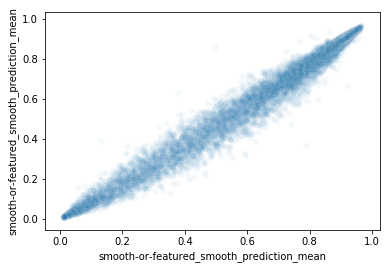

In [16]:
sns.scatterplot(df_a['smooth-or-featured_smooth_prediction_mean'], df_b['smooth-or-featured_smooth_prediction_mean'], alpha=0.05)

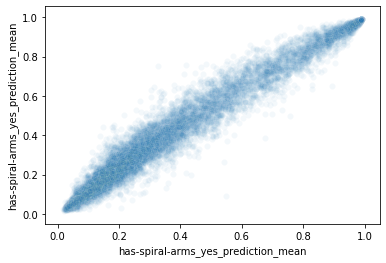

In [17]:
sns.scatterplot(df_a['has-spiral-arms_yes_prediction_mean'], df_b['has-spiral-arms_yes_prediction_mean'], alpha=0.05)

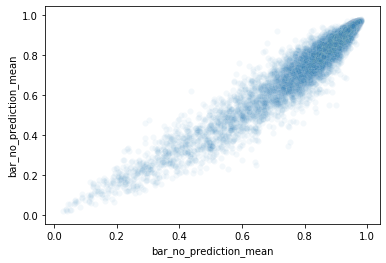

In [18]:
sns.scatterplot(df_a['bar_no_prediction_mean'], df_b['bar_no_prediction_mean'], alpha=0.05)

In [19]:
import tensorflow_probability as tfp

In [20]:
question = schema.get_question('smooth-or-featured')
# question = schema.get_question('has-spiral-arms')
# question = schema.get_question('bar')
answer = question.answers[0]

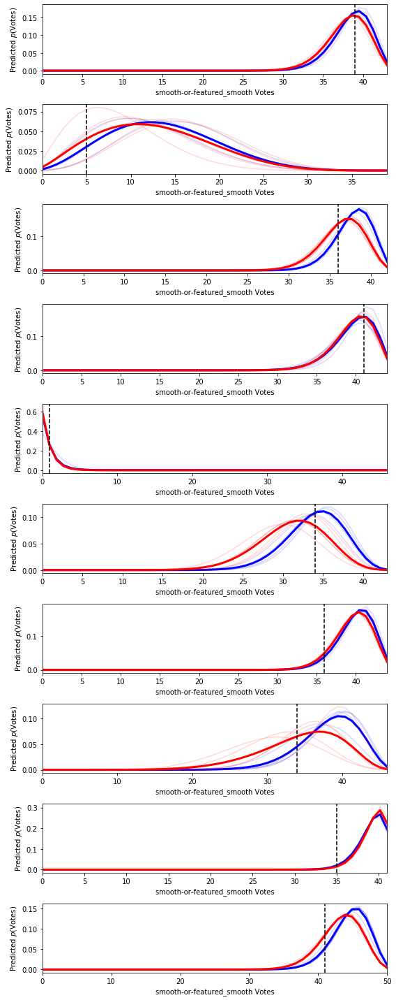

In [21]:

fig, axes = plt.subplots(nrows=10, figsize=(8, 20))
dropout_n = df_a_conc.shape[2]
for n in range(10):
    
    ax = axes[n]
    
    galaxy = df_a.iloc[n]
    total_votes = float(galaxy[question.text+'_total-votes'])
    observed_value = df_a[answer.text].iloc[n]
    
    votes = np.linspace(0., total_votes)
    x = np.stack([votes, total_votes-votes], axis=-1)  # also need the counts for other answer, no
    votes_this_answer = x[:, answer.index - question.start_index]

    all_log_probs = []
    for d in range(dropout_n):
        concentrations = tf.constant(df_a_conc[n, question.start_index:question.end_index+1, d].astype(np.float32))
        log_probs = tfp.distributions.DirichletMultinomial(total_votes, concentrations).prob(x)
        all_log_probs.append(log_probs)
        ax.plot(votes_this_answer, log_probs, alpha=.15, color='b')
    all_log_probs = np.array(all_log_probs).mean(axis=0)
    ax.plot(votes_this_answer, all_log_probs, linewidth=3., color='b')
    
    all_log_probs = []
    for d in range(dropout_n):
        concentrations = tf.constant(df_b_conc[n, question.start_index:question.end_index+1, d].astype(np.float32))
        log_probs = tfp.distributions.DirichletMultinomial(total_votes, concentrations).prob(x)
        all_log_probs.append(log_probs)
        ax.plot(votes_this_answer, log_probs, alpha=.15, color='r')
    all_log_probs = np.array(all_log_probs).mean(axis=0)
    ax.plot(votes_this_answer, all_log_probs, linewidth=3., color='r')

    ax.axvline(observed_value, color='k', linestyle='--')
    ax.set_xlim(0., total_votes)
    
    ax.set_xlabel(answer.text + ' Votes')
#     ax.set_xlabel('Weak Bar Votes')
    ax.set_ylabel(r'Predicted $p$(Votes)')
    
#     ax.set_title('Mutual Info: ' + str(np.around(df_a[question.text + '_acquisition'].iloc[n], 2)))
    
fig.tight_layout()

In [22]:
new = True
if new:
    samples_list = [df_a_conc[:500], df_b_conc[:500]]
#     samples_list = [df_a_conc, df_b_conc]
    mi, predictive, expected = acquisition_utils.get_multimodel_acq(samples_list, schema)
    mi.shape

smooth-or-featured
Calculating predictive entropy
Calculating expected entropy
Calculating joint p of being asked
disk-edge-on
Calculating predictive entropy
Calculating expected entropy
Calculating joint p of being asked
has-spiral-arms
Calculating predictive entropy
Calculating expected entropy
Calculating joint p of being asked
bar
Calculating predictive entropy
Calculating expected entropy
Calculating joint p of being asked
bulge-size
Calculating predictive entropy
Calculating expected entropy
Calculating joint p of being asked
something-odd
Calculating predictive entropy
Calculating expected entropy
Calculating joint p of being asked
how-rounded
Calculating predictive entropy
Calculating expected entropy
Calculating joint p of being asked
bulge-shape
Calculating predictive entropy
Calculating expected entropy
Calculating joint p of being asked
spiral-winding
Calculating predictive entropy
Calculating expected entropy
Calculating joint p of being asked
spiral-count
Calculating pred

In [23]:
if new:
    np.savetxt('results/temp/latest_mi.npy', mi)

(array([  6.,   2.,   3.,  63., 146.,  65.,  57.,  52.,  68.,  38.]),
 array([-3.43919065, -3.13178591, -2.82438117, -2.51697643, -2.20957168,
        -1.90216694, -1.5947622 , -1.28735746, -0.97995272, -0.67254797,
        -0.36514323]),
 <a list of 10 Patch objects>)

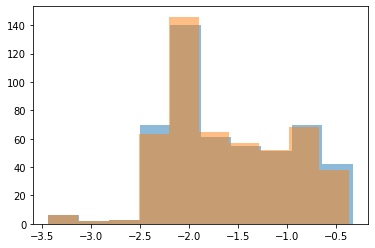

In [24]:
alpha = .5
plt.hist(predictive[:, 0], alpha=alpha)
plt.hist(expected[:, 0], alpha=alpha)

In [25]:
# mi = np.loadtxt('results/temp/latest_mi.npy')

In [26]:
acquisition_values = mi

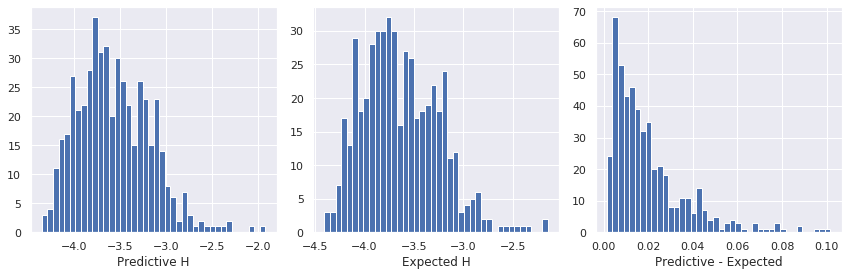

In [27]:
sns.set()
fig, axes = plt.subplots(ncols=3, figsize=(12, 4))

axes[0].hist(predictive.mean(axis=1), bins=40)
axes[0].set_xlabel('Predictive H')

axes[1].hist(expected.mean(axis=1), bins=40)
axes[1].set_xlabel('Expected H')

axes[2].hist(acquisition_values.mean(axis=1), bins=40)
axes[2].set_xlabel('Predictive - Expected')

fig.tight_layout()

In [28]:
# np.percentile(acquisition_values.mean(axis=1), )

In [29]:
schema.questions

[smooth-or-featured, indices 0 to 1, asked after None,
 disk-edge-on, indices 2 to 3, asked after smooth-or-featured_featured-or-disk, index 1,
 has-spiral-arms, indices 4 to 5, asked after disk-edge-on_no, index 3,
 bar, indices 6 to 7, asked after disk-edge-on_no, index 3,
 bulge-size, indices 8 to 11, asked after disk-edge-on_no, index 3,
 something-odd, indices 12 to 13, asked after None,
 how-rounded, indices 14 to 16, asked after smooth-or-featured_smooth, index 0,
 bulge-shape, indices 17 to 19, asked after disk-edge-on_yes, index 2,
 spiral-winding, indices 20 to 22, asked after has-spiral-arms_yes, index 4,
 spiral-count, indices 23 to 28, asked after has-spiral-arms_yes, index 4]

In [30]:
[q.text for q in schema.questions]

['smooth-or-featured',
 'disk-edge-on',
 'has-spiral-arms',
 'bar',
 'bulge-size',
 'something-odd',
 'how-rounded',
 'bulge-shape',
 'spiral-winding',
 'spiral-count']

In [31]:
acquisition_values.shape

(500, 10)

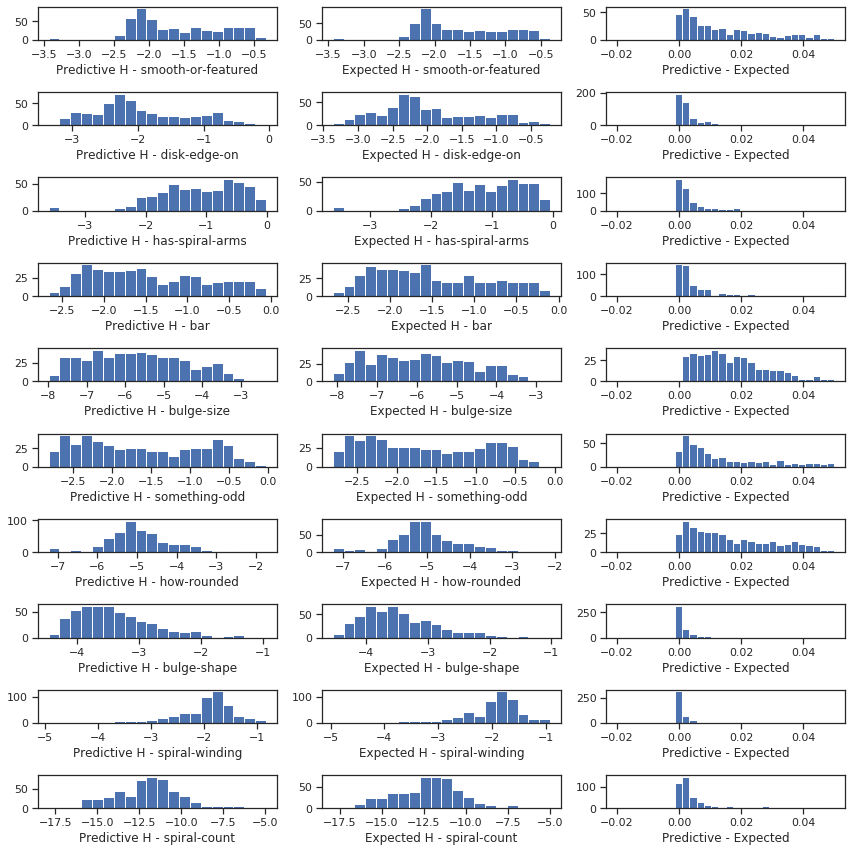

In [85]:
sns.set_style('ticks')

n_questions = len(schema.questions)
fig, axes = plt.subplots(nrows=n_questions, ncols=3, figsize=(12, 12))

for question_n, question in enumerate(schema.questions):
#     if question.text != 'spiral-count':
        row = axes[question_n]

        predictive_q = predictive[:, question_n]
        expected_q = expected[:, question_n]
        acq_q = acquisition_values[:, question_n]

        _, bins = np.histogram(np.linspace(0, .1), bins=30)
        row[0].hist(predictive_q, bins=20)
        row[0].set_xlabel('Predictive H - ' + question.text)

        _, bins = np.histogram(np.linspace(0, .1), bins=30)
        row[1].hist(expected_q, bins=20)
        row[1].set_xlabel('Expected H - ' + question.text)

        _, bins = np.histogram(np.linspace(-0.02, 0.05), bins=30)
        row[2].hist(acq_q, bins=bins)
        row[2].set_xlabel('Predictive - Expected')
#         row[2].set_xlim([-0.1, .2])

fig.tight_layout()

In [33]:
acquisition_values_raw = acquisition_values.copy()

In [34]:
schema.questions

[smooth-or-featured, indices 0 to 1, asked after None,
 disk-edge-on, indices 2 to 3, asked after smooth-or-featured_featured-or-disk, index 1,
 has-spiral-arms, indices 4 to 5, asked after disk-edge-on_no, index 3,
 bar, indices 6 to 7, asked after disk-edge-on_no, index 3,
 bulge-size, indices 8 to 11, asked after disk-edge-on_no, index 3,
 something-odd, indices 12 to 13, asked after None,
 how-rounded, indices 14 to 16, asked after smooth-or-featured_smooth, index 0,
 bulge-shape, indices 17 to 19, asked after disk-edge-on_yes, index 2,
 spiral-winding, indices 20 to 22, asked after has-spiral-arms_yes, index 4,
 spiral-count, indices 23 to 28, asked after has-spiral-arms_yes, index 4]

In [35]:
acquisition_values.mean(axis=0)

array([0.03382672, 0.00547599, 0.00769744, 0.00809909, 0.04092951,
       0.03127675, 0.04205278, 0.00339631, 0.00716804, 0.02018967])

In [36]:
np.isnan(acquisition_values).sum()

0

In [37]:
acquisition_values[np.isnan(acquisition_values)] = 0

In [38]:
np.isnan(acquisition_values.mean(axis=0)).sum()

0

In [39]:
acquisition_values.mean(axis=0)

array([0.03382672, 0.00547599, 0.00769744, 0.00809909, 0.04092951,
       0.03127675, 0.04205278, 0.00339631, 0.00716804, 0.02018967])

In [40]:
len(acquisition_values.mean(axis=0)), len([q.text for q in schema.questions][:9])

(10, 9)

In [41]:
acquisition_values.shape

(500, 10)

In [42]:
# sns.barplot(x=acquisition_values.mean(axis=0), y=[q.text for q in schema.questions][:9])

In [43]:
len(acquisition_values)

500

In [44]:
len(df_a)

15000

In [45]:
df_a = df_a[:500]
df_b = df_b[:500]

In [100]:
for question_n, question in enumerate(schema.questions):
    df_a[question.text + '_acquisition'] = acquisition_values[:, question_n]
    df_a[question.text + '_predictive_entropy'] = predictive[:, question_n]
    df_a[question.text + '_expected_entropy'] = expected[:, question_n]
df_a['acquisition_mean'] = acquisition_values.mean(axis=1)
df_a['predictive_entropy_mean'] = predictive.mean(axis=1)
df_a['expected_entropy_mean'] = expected.mean(axis=1)

(0, 0.16196432765319702)

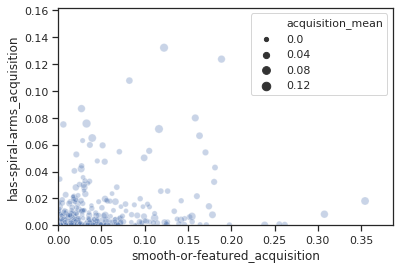

In [92]:
sns.scatterplot(data=df_a, x='smooth-or-featured_acquisition', y='has-spiral-arms_acquisition', alpha=.3, size='acquisition_mean')
plt.xlim(0, None)
plt.ylim(0, None)

(0, 0.16196432765319702)

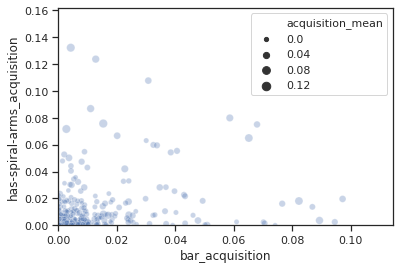

In [93]:
sns.scatterplot(data=df_a, x='bar_acquisition', y='has-spiral-arms_acquisition', alpha=.3, size='acquisition_mean')
plt.xlim(0, None)
plt.ylim(0, None)

(0, 0.16196432765319702)

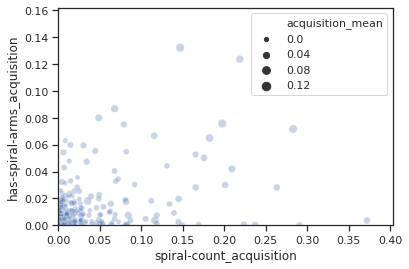

In [102]:
sns.scatterplot(data=df_a, x='spiral-count_acquisition', y='has-spiral-arms_acquisition', alpha=.3, size='acquisition_mean')
plt.xlim(0, None)
plt.ylim(0, None)

(0, 0.16196432765319702)

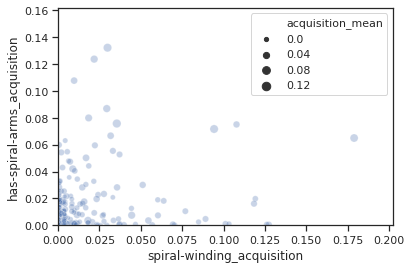

In [103]:
sns.scatterplot(data=df_a, x='spiral-winding_acquisition', y='has-spiral-arms_acquisition', alpha=.3, size='acquisition_mean')
plt.xlim(0, None)
plt.ylim(0, None)

In [47]:
df_a['file_loc_gz2'] = df_a['file_loc'].apply(lambda x: x.replace('decals/png_native', 'gz2/png' ))

/home/walml/anaconda3/envs/zoobot/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  


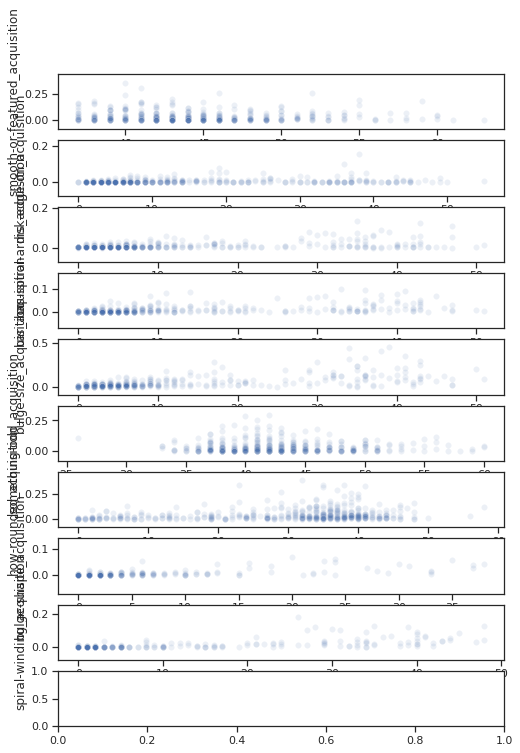

In [48]:
fig, axes = plt.subplots(nrows=n_questions, figsize=(8, 12))

for question_n in range(n_questions):
    if question_n != 9:
        sns.scatterplot(data=df_a, x=schema.questions[question_n].text + '_total-votes', y=schema.questions[question_n].text + '_acquisition', ax=axes[question_n], alpha=.1)
fig.tight_layout()

In [49]:
# question = schema.get_question('smooth-or-featured')
question = schema.get_question('has-spiral-arms')
# question = schema.get_question('bar')
answer = question.answers[0]

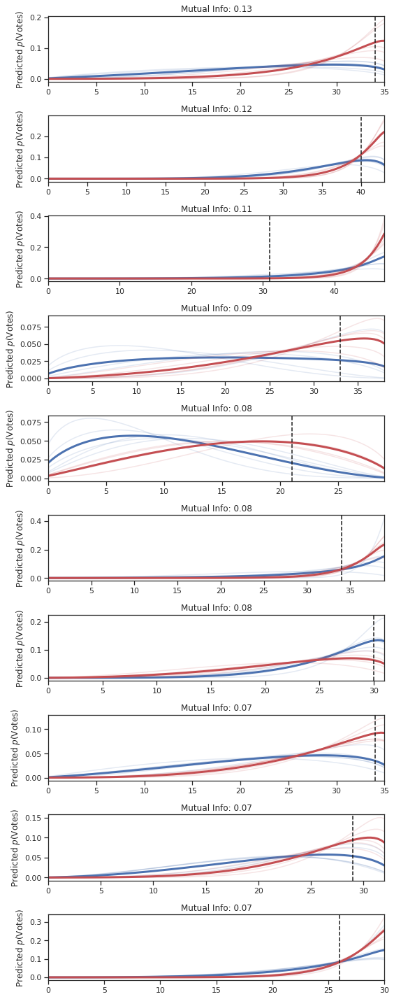

In [50]:


# mi_argsort = np.argsort(df_a[question.text + '_acquisition'])
mi_argsort = np.argsort(df_a[question.text + '_acquisition'])[::-1]

# mi_argsort = np.argsort(df_a['acquisition_mean'])[::-1]

fig, axes = plt.subplots(nrows=10, figsize=(8, 20))
for n in range(10):
    

    specific_d = 2
    
    ax = axes[n]
    
#     n = n + 15  # the top 1% are generally failures where a single dropout sample has gone super weird
    
    
    galaxy = df_a.iloc[mi_argsort].iloc[n]
    total_votes = float(galaxy[question.text+'_total-votes'])
    observed_value = galaxy[answer.text]
    
    num = 100
    votes = np.linspace(0., total_votes, num=num)
    x = np.stack([votes, total_votes-votes], axis=-1)  # also need the counts for other answer, no
    votes_this_answer = x[:, answer.index - question.start_index]

    all_log_probs = []
    for d in range(5):
        concentrations = tf.constant(df_a_conc[mi_argsort][n, question.start_index:question.end_index+1, d].astype(np.float32))
#         if np.all(concentrations < min_concentration):
#                 if np.mean(concentrations) > min_concentration:
        log_probs = tfp.distributions.DirichletMultinomial(total_votes, concentrations).prob(x)
        all_log_probs.append(log_probs)
    #                     print(d, concentrations)
        ax.plot(votes_this_answer, log_probs, alpha=.15, color='b')
    all_log_probs = np.array(all_log_probs).reshape(-1, num).mean(axis=0)
    ax.plot(votes_this_answer, all_log_probs, linewidth=3., color='b')
    
#     break
    
    all_log_probs = []
    for d in range(5):
        concentrations = tf.constant(df_b_conc[mi_argsort][n, question.start_index:question.end_index+1, d].astype(np.float32))
#         if np.mean(concentrations) > min_concentration:
#         if np.all(concentrations < min_concentration):
        log_probs = tfp.distributions.DirichletMultinomial(total_votes, concentrations).prob(x)
        all_log_probs.append(log_probs)
        ax.plot(votes_this_answer, log_probs, alpha=.15, color='r')
    all_log_probs = np.array(all_log_probs).reshape(-1, num).mean(axis=0)
    ax.plot(votes_this_answer, all_log_probs, linewidth=3., color='r')

    ax.axvline(observed_value, color='k', linestyle='--')
    ax.set_xlim(0., total_votes)
    
#     ax.set_xlabel(answer.text + ' Votes')
#     ax.set_xlabel('Weak Bar Votes')
    ax.set_ylabel(r'Predicted $p$(Votes)')
    
    ax.set_title('Mutual Info: ' + str(np.around(df_a[question.text + '_acquisition'].iloc[mi_argsort].iloc[n], 2)))
    
fig.tight_layout()

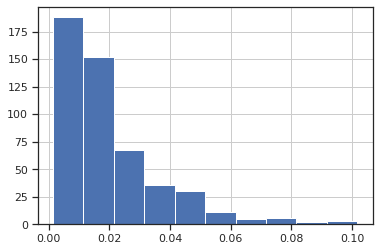

In [51]:
df_a['acquisition_mean'].hist()

<Figure size 432x288 with 0 Axes>

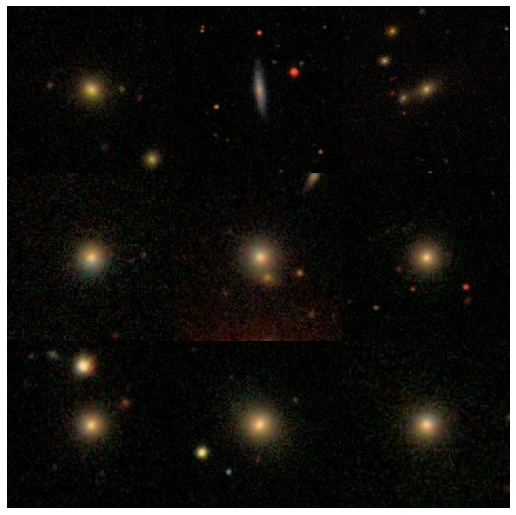

In [52]:
_ = show_galaxies(df_a.sort_values('acquisition_mean'))

<Figure size 432x288 with 0 Axes>

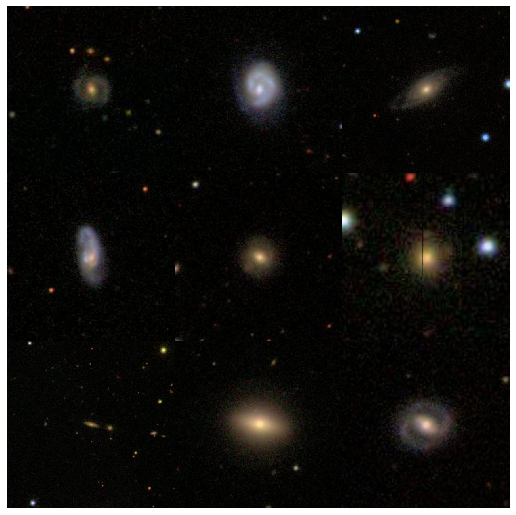

In [53]:
_ = show_galaxies(df_a.sort_values('acquisition_mean', ascending=False))

<Figure size 432x288 with 0 Axes>

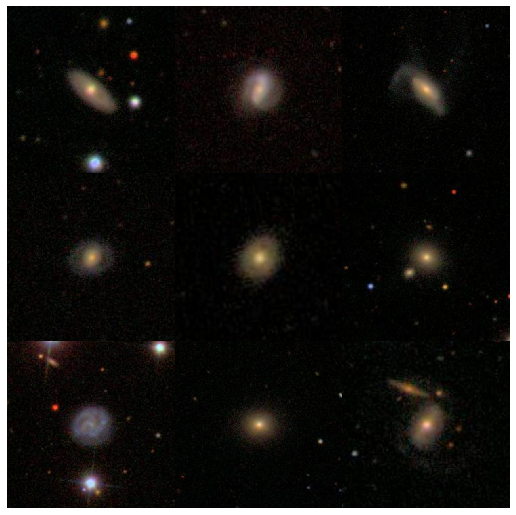

In [54]:
_ = show_galaxies(df_a.sort_values('acquisition_mean', ascending=False)[50:])

<Figure size 432x288 with 0 Axes>

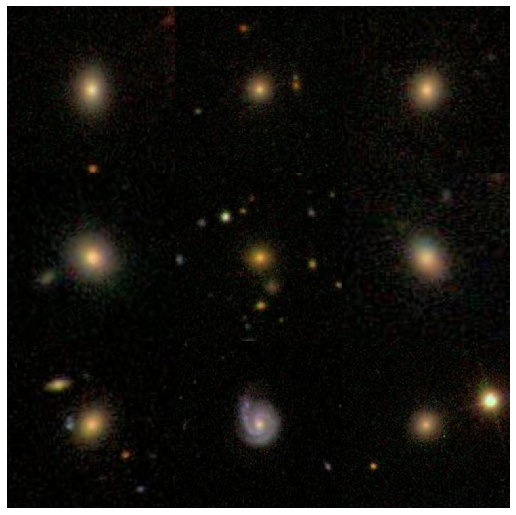

In [55]:
_ = show_galaxies(df_a.sort_values('smooth-or-featured_acquisition'))

<Figure size 432x288 with 0 Axes>

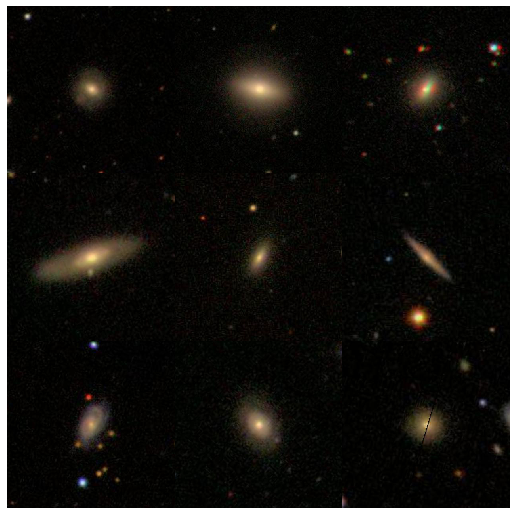

In [56]:
_ = show_galaxies(df_a.sort_values('smooth-or-featured_acquisition', ascending=False))

<Figure size 432x288 with 0 Axes>

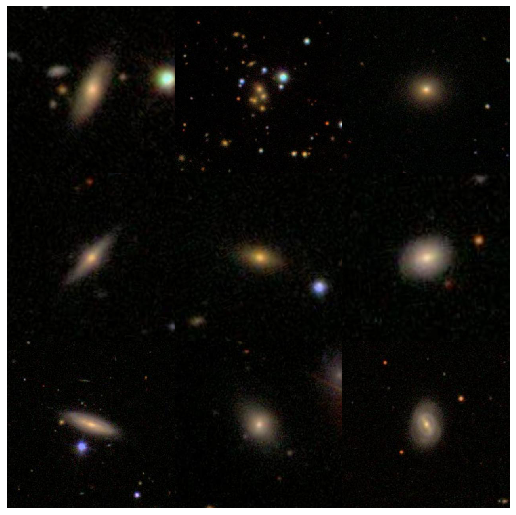

In [57]:
_ = show_galaxies(df_a.sort_values('smooth-or-featured_acquisition', ascending=False)[50:])

<Figure size 432x288 with 0 Axes>

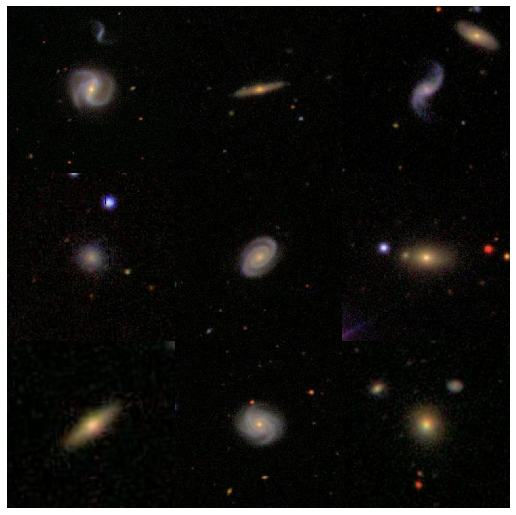

In [58]:
_ = show_galaxies(df_a.sort_values('has-spiral-arms_acquisition'))

<Figure size 432x288 with 0 Axes>

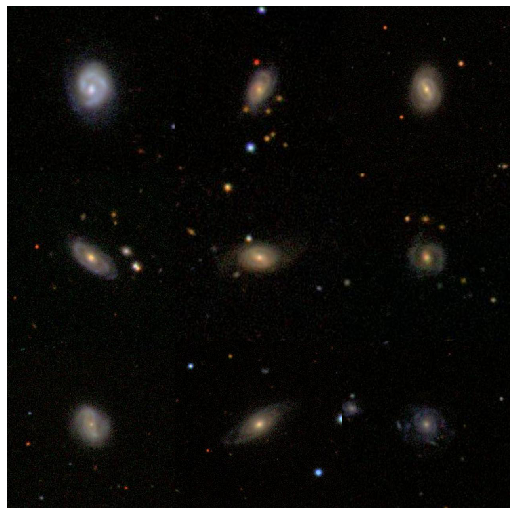

In [59]:
_ = show_galaxies(df_a.sort_values('has-spiral-arms_acquisition', ascending=False))

<Figure size 432x288 with 0 Axes>

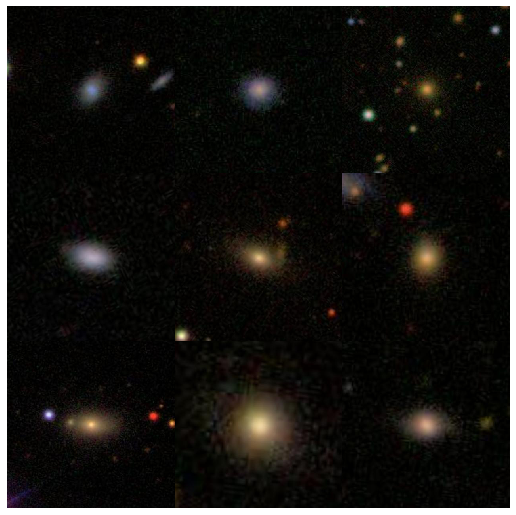

In [60]:
_ = show_galaxies(df_a.sort_values('bar_acquisition'))

<Figure size 432x288 with 0 Axes>

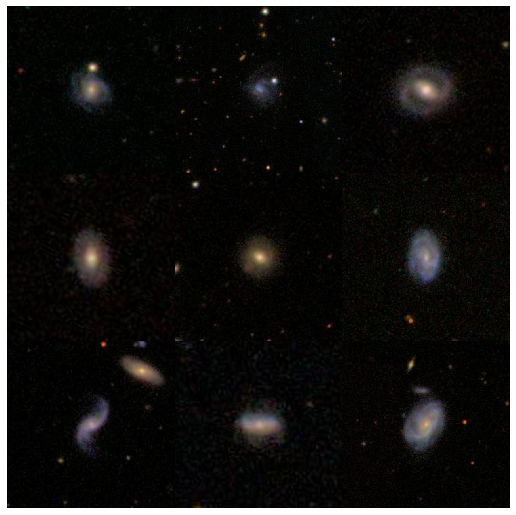

In [61]:
_ = show_galaxies(df_a.sort_values('bar_acquisition', ascending=False))

<Figure size 432x288 with 0 Axes>

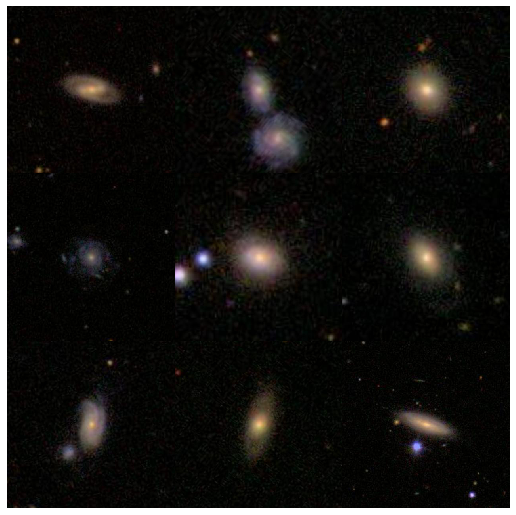

In [62]:
_ = show_galaxies(df_a.sort_values('bar_acquisition', ascending=False)[50:])

<Figure size 432x288 with 0 Axes>

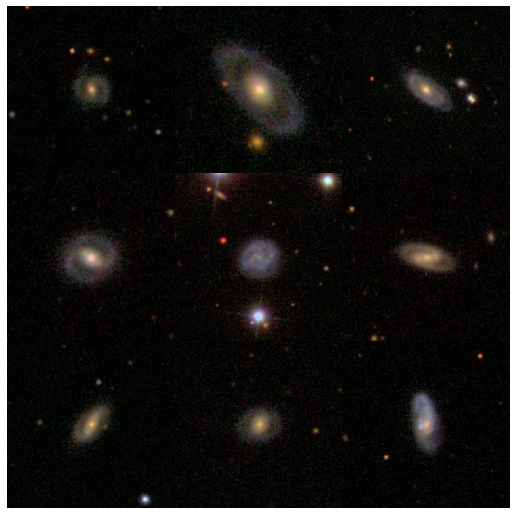

In [63]:
_ = show_galaxies(df_a.sort_values('bulge-size_acquisition', ascending=False))

<Figure size 432x288 with 0 Axes>

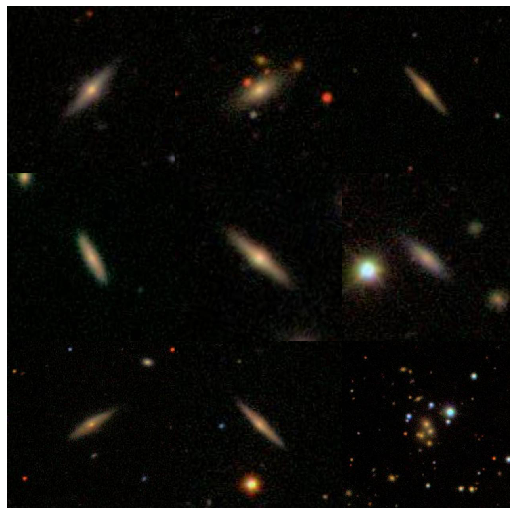

In [64]:
_ = show_galaxies(df_a.sort_values('bulge-size_acquisition'))

In [65]:
df_a['smooth-or-featured_predictive_entropy']

0     -1.946782
1     -0.521069
2     -1.878064
3     -1.813196
4     -3.196820
         ...   
495   -1.998980
496   -2.373896
497   -2.413207
498   -2.201906
499   -0.587018
Name: smooth-or-featured_predictive_entropy, Length: 500, dtype: float64

<Figure size 432x288 with 0 Axes>

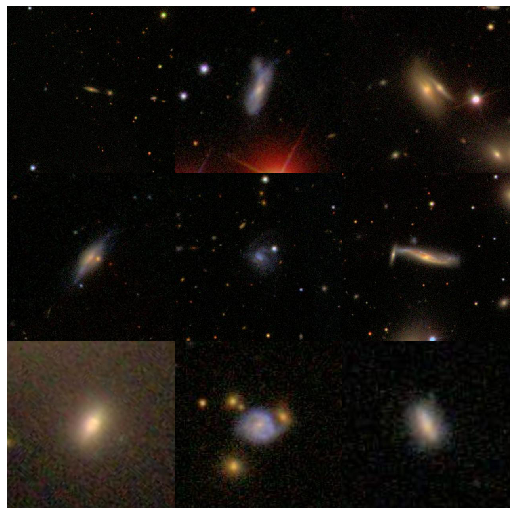

In [66]:
_ = show_galaxies(df_a.sort_values('predictive_entropy_mean', ascending=False))

<Figure size 432x288 with 0 Axes>

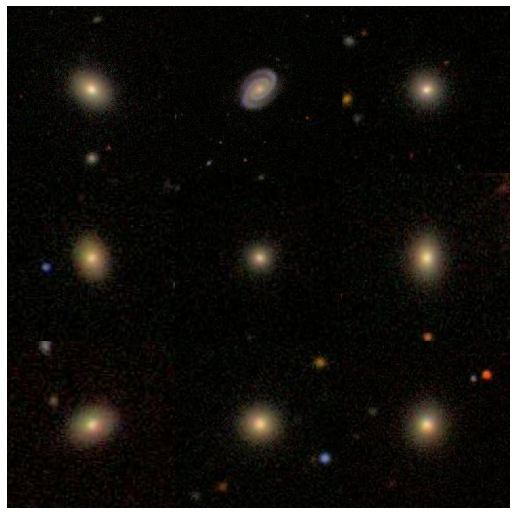

In [67]:
_ = show_galaxies(df_a.sort_values('predictive_entropy_mean', ascending=True))

<Figure size 432x288 with 0 Axes>

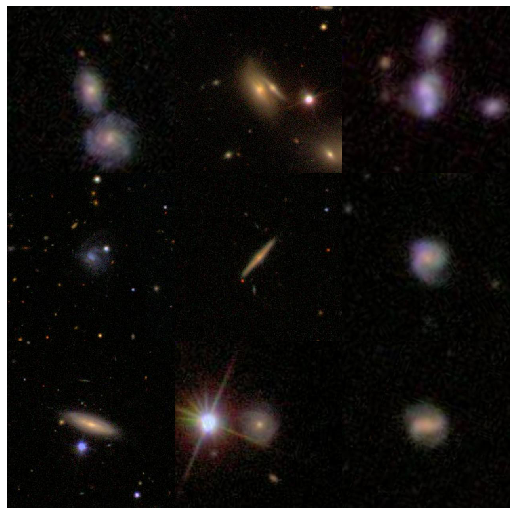

In [68]:
_ = show_galaxies(df_a.sort_values('smooth-or-featured_predictive_entropy', ascending=False))

<Figure size 432x288 with 0 Axes>

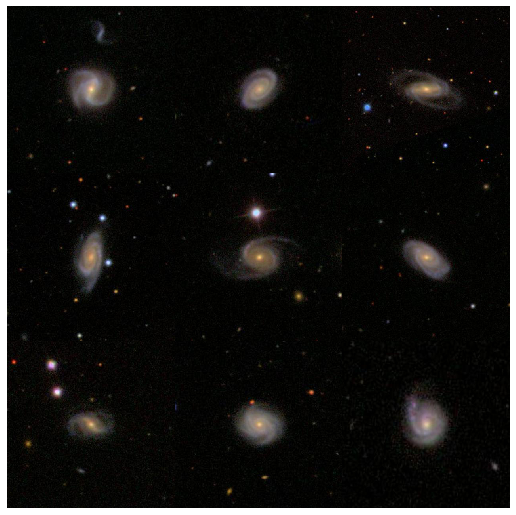

In [69]:
_ = show_galaxies(df_a.sort_values('smooth-or-featured_predictive_entropy'))

<Figure size 432x288 with 0 Axes>

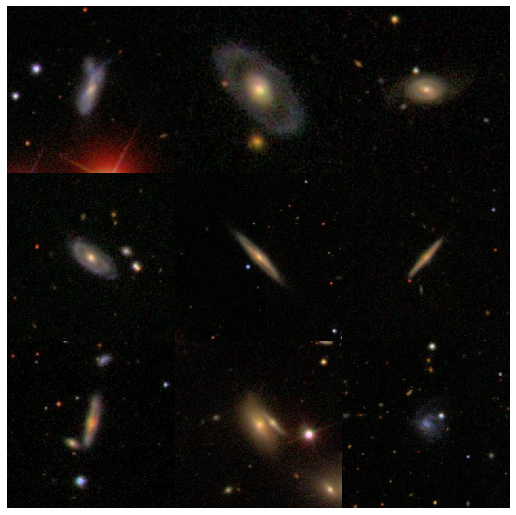

In [70]:
_ = show_galaxies(df_a.sort_values('has-spiral-arms_predictive_entropy', ascending=False))

<Figure size 432x288 with 0 Axes>

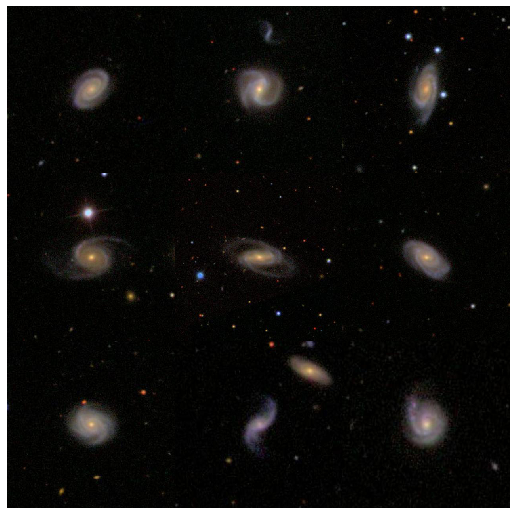

In [71]:
_ = show_galaxies(df_a.sort_values('has-spiral-arms_predictive_entropy'))

<Figure size 432x288 with 0 Axes>

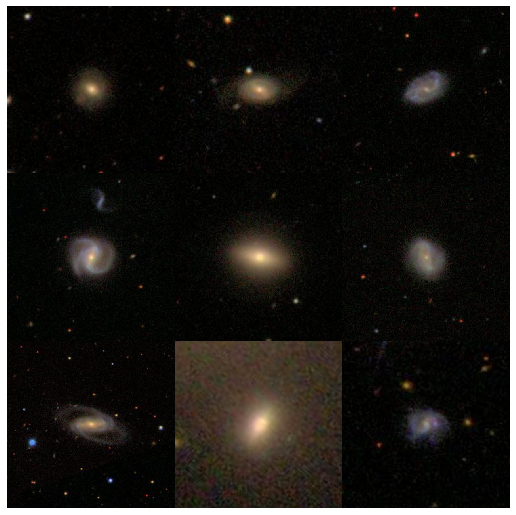

In [72]:
_ = show_galaxies(df_a.sort_values('bar_predictive_entropy', ascending=False))

<Figure size 432x288 with 0 Axes>

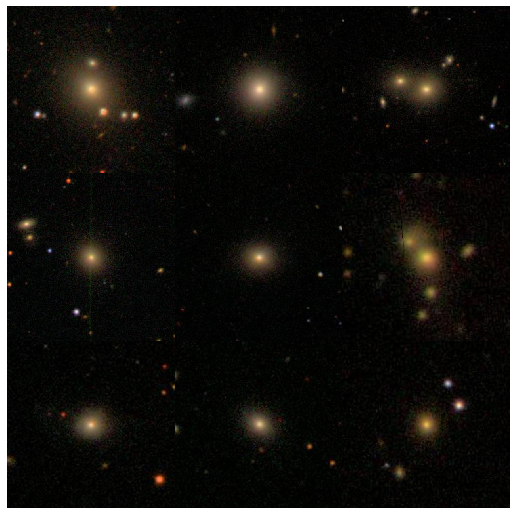

In [73]:
_ = show_galaxies(df_a.sort_values('bar_predictive_entropy'))

<Figure size 432x288 with 0 Axes>

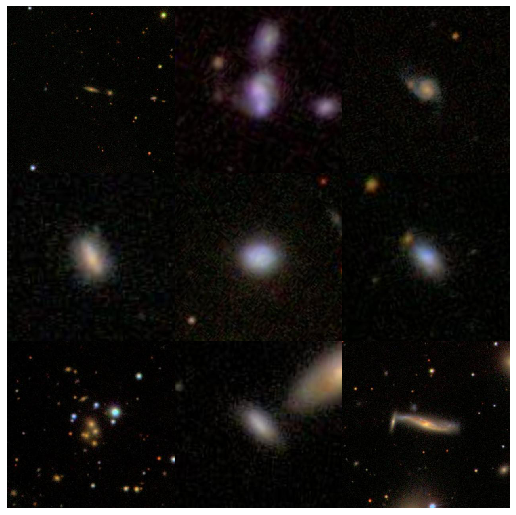

In [74]:
_ = show_galaxies(df_a.sort_values('bulge-size_expected_entropy', ascending=False))

<Figure size 432x288 with 0 Axes>

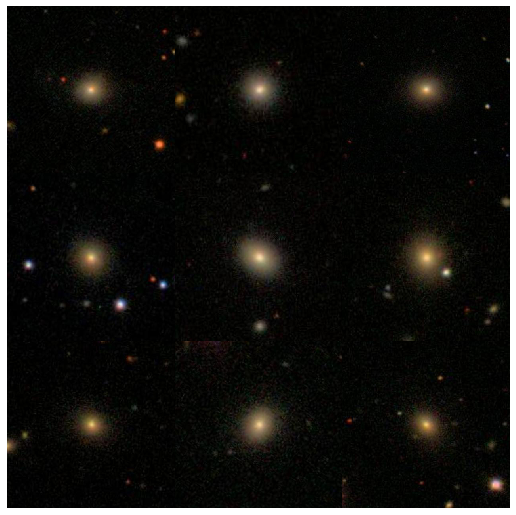

In [75]:
_ = show_galaxies(df_a.sort_values('bulge-size_expected_entropy'))

In [76]:
safe_catalog = pd.read_csv('results/temp/safe_catalog.csv')

In [77]:
acquired_df = pd.merge(safe_catalog, df_a, on='dr7objid', how='inner', suffixes=('_catalog', ''))
len(acquired_df)

395

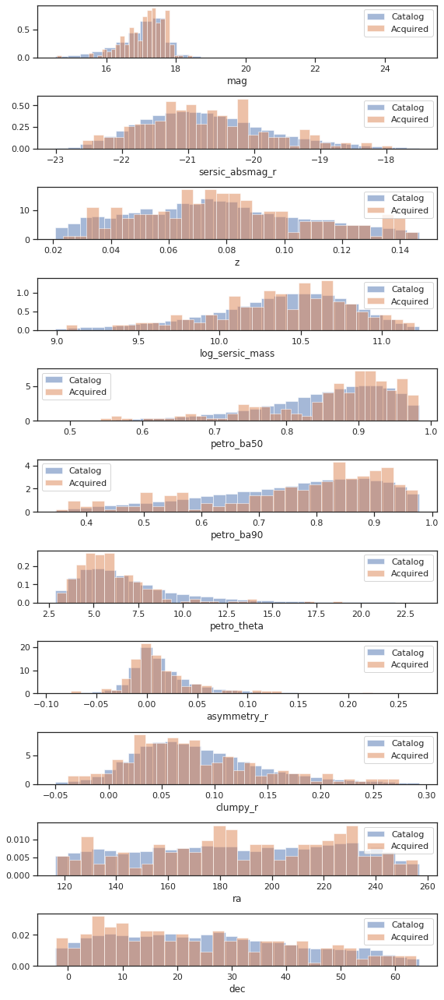

In [78]:

relevant_physical_cols = ['mag', 'sersic_absmag_r', 'z', 'log_sersic_mass', 'petro_ba50', 'petro_ba90', 'petro_theta', 'asymmetry_r', 'clumpy_r', 'ra', 'dec']

fig, axes = plt.subplots(figsize=(8, 18), nrows=len(relevant_physical_cols))
alpha = .5

# _, bins = np.histogram(np.linspace(0., 1.), bins=30)
bins=30


for (n, col) in enumerate(relevant_physical_cols):
    col = col.lower()
    ax = axes[n]
    ax.hist(safe_catalog[col], alpha=alpha, label='Catalog', density=True, bins=bins)
    ax.hist(acquired_df.sort_values('acquisition_mean')[col][:200], alpha=alpha, label='Acquired', density=True, bins=bins)
    ax.set_xlabel(col)
    ax.legend()
    fig.tight_layout()

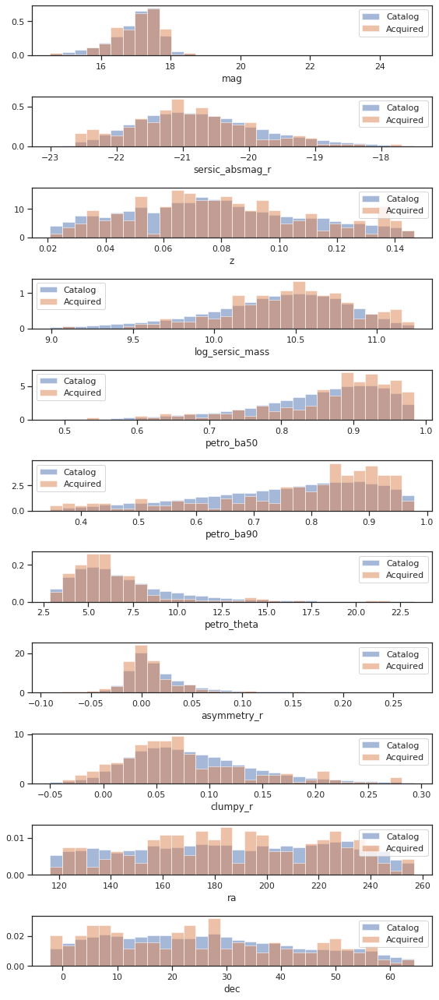

In [79]:

relevant_physical_cols = ['mag', 'sersic_absmag_r', 'z', 'log_sersic_mass', 'petro_ba50', 'petro_ba90', 'petro_theta', 'asymmetry_r', 'clumpy_r', 'ra', 'dec']

fig, axes = plt.subplots(figsize=(8, 18), nrows=len(relevant_physical_cols))
alpha = .5


bins=30


for (n, col) in enumerate(relevant_physical_cols):
    col = col.lower()
    ax = axes[n]
    _, bins = np.histogram(safe_catalog[col], bins=30)
    ax.hist(safe_catalog[col], alpha=alpha, label='Catalog', density=True, bins=bins)
    ax.hist(acquired_df.sort_values('predictive_entropy_mean')[col][:200], alpha=alpha, label='Acquired', density=True, bins=bins)
    ax.set_xlabel(col)
    ax.legend()
    fig.tight_layout()

In [80]:
assert False

AssertionError: 

In [ ]:
mi_reliable = acquisition_utils.calculate_reliable_multimodel_mean_acq(samples_list, schema)

In [ ]:
mi_reliable

In [ ]:
plt.scatter(acquisitions, mi_reliable)